<a href="https://colab.research.google.com/github/anacaetano02/Projetos-Redes-Neurais/blob/main/ham10000_treino.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Orquestrador de Treino — Lesões de Pele (HAM10000)

Este notebook liga as quatro peças que vivem em `src/` (`data.py`,
`models.py`, `training.py`, `utils.py`) numa execução única: aquisição do
HAM10000 no Kaggle, montagem do inventário particionado por lesão (sem
vazamento entre imagens da mesma lesão), EDA visual/estatística, baseline
não trivial (features de cor+textura), treino da CNN de referência,
interpretação de erro, e uma variante ilustrativa LSTM-sobre-patches
("Etapa 2") — todos comparados no mesmo log de experimentos.


## 1. Código-fonte e dependências

Primeiro clona o repositório (para ter `src/` e o `requirements.txt`
disponíveis) e só então instala as dependências a partir desse
`requirements.txt` — evita manter a lista de pacotes duplicada entre o
notebook e o repositório.

In [1]:
# AJUSTE: URL do seu repositório git e o caminho da subpasta deste projeto
# dentro dele (clone via sparse-checkout — só essa subpasta é baixada, o
# resto do repositório nem chega a ser transferido).
REPO_URL = "https://github.com/anacaetano02/Projetos-Redes-Neurais.git"
SUBPASTA = "projeto_2_cnn"
REPO_DIR = "/content/repo"

if not REPO_URL:
    raise ValueError("Defina REPO_URL com a URL do seu repositório git antes de continuar.")

import os
import subprocess

PROJECT_DIR = os.path.join(REPO_DIR, SUBPASTA)

if not os.path.isdir(os.path.join(REPO_DIR, ".git")):
    # --filter=blob:none: baixa só os metadados de commit/árvore, os
    # arquivos (blobs) de fora do sparse-checkout nunca são transferidos.
    # --sparse liga o modo cone do sparse-checkout (mais rápido e mais
    # simples de configurar que listar padrões manualmente).
    subprocess.run(
        ["git", "clone", "--filter=blob:none", "--sparse", "--depth", "1", REPO_URL, REPO_DIR],
        check=True,
    )
    subprocess.run(["git", "sparse-checkout", "set", SUBPASTA], cwd=REPO_DIR, check=True)
else:
    # Repositório já clonado nesta sessão do Colab (variável de estado que
    # sobrevive a reexecuções de célula, só não a reinício de runtime) —
    # git pull traz commits novos em vez de simplesmente pular, para
    # mudanças feitas no código depois do clone inicial não ficarem presas
    # do lado de fora.
    print(f"Repositório já clonado em '{REPO_DIR}' — buscando mudanças mais recentes...")
    subprocess.run(["git", "pull"], cwd=REPO_DIR, check=True)


In [2]:
# torch/torchvision já vêm prontos no Colab; polars, scikit-image e a CLI
# do kaggle não. pip install -r (SEM --upgrade geral) é idempotente —
# reinstalar uma dependência já satisfeita é pulado, o resto é instalado.
#
# NADA de --upgrade geral aqui: numpy/scipy vêm pré-instalados no Colab em
# versões testadas JUNTAS (o scipy tem extensões Cython compiladas contra
# a API interna do numpy daquela versão específica). Forçar upgrade do
# numpy sozinho (numpy>=1.24.0 no requirements.txt) sem levar o scipy
# junto (nem está no requirements.txt — é dependência transitiva do
# scikit-image) quebra essa extensão compilada na próxima vez que algo a
# importa: "ImportError: cannot import name '_slice' from
# numpy._core.umath", disparado aqui pelo `from src.data import ...` (que
# importa skimage.feature.local_binary_pattern -> scipy.linalg).
import sys

requirements_path = os.path.join(PROJECT_DIR, "requirements.txt")
subprocess.run(
    [sys.executable, "-m", "pip", "install", "-q", "-r", requirements_path],
    check=True,
)

# kaggle é a única exceção que precisa de upgrade forçado: o Colab pode
# vir com uma versão antiga pré-instalada, que já satisfaz "kaggle>=1.6.0"
# sem precisar atualizar, mas sem suporte ao token novo (KGAT_...) usado
# aqui. Upgrade isolado — não arrasta numpy/scipy/scikit-image junto.
subprocess.run(
    [sys.executable, "-m", "pip", "install", "-q", "--upgrade", "kaggle>=1.6.0"],
    check=True,
)


CompletedProcess(args=['/usr/bin/python3', '-m', 'pip', 'install', '-q', '--upgrade', 'kaggle>=1.6.0'], returncode=0)

## 2. Onde salvar dados e artefatos

Este projeto trabalha com milhares de imagens pequenas — ler direto do
Drive via FUSE é lento o bastante para atrapalhar o treino. Por isso há
duas camadas de armazenamento:

- **`BASE_DIR`** (Drive, se `SALVAR_NO_DRIVE = True`): dataset bruto,
  inventário particionado, checkpoints, logs — persiste entre reinícios
  de runtime.
- **`LOCAL_DIR`** (sempre `/content`, nunca Drive): cópia local das
  imagens para leitura rápida durante o treino — efêmera por design (some
  ao reiniciar o runtime), mas barata de refazer (seção 6.2).

**AJUSTE** `SALVAR_NO_DRIVE` e o caminho de `BASE_DIR` dentro do Drive, se
necessário.

In [3]:
# Onde salvar dados e artefatos desta execução.
SALVAR_NO_DRIVE = False  # AJUSTE conforme sua preferência.

if SALVAR_NO_DRIVE:
    from google.colab import drive
    drive.mount("/content/drive")
    # AJUSTE: caminho da pasta de saída dentro do seu Drive.
    BASE_DIR = "/content/drive/MyDrive/rede_neural_projetos/projeto_2_cnn"
else:
    BASE_DIR = "/content/projeto_2_cnn_saida"

BASE_DIR = os.path.abspath(BASE_DIR)
print(f"BASE_DIR = {BASE_DIR} (Drive: {SALVAR_NO_DRIVE})")


BASE_DIR = /content/projeto_2_cnn_saida (Drive: False)


In [4]:
# Estrutura de saída (Drive/BASE_DIR) + cópia local das imagens (sempre /content).
DIR_DADOS_RAW = os.path.join(BASE_DIR, "data", "raw")
DIR_DADOS_PROCESSADOS = os.path.join(BASE_DIR, "data", "processed")
DIR_OUTPUTS = os.path.join(BASE_DIR, "outputs")
DIR_CHECKPOINTS = os.path.join(DIR_OUTPUTS, "checkpoints")
DIR_REPORT_ASSETS = os.path.join(DIR_OUTPUTS, "report_assets")
DIR_RUNS = os.path.join(BASE_DIR, "runs")  # logs do TensorBoard

LOCAL_DIR = "/content/local_data"  # nunca no Drive — ver seção 2 acima

for d in (DIR_DADOS_RAW, DIR_DADOS_PROCESSADOS, DIR_CHECKPOINTS, DIR_REPORT_ASSETS, DIR_RUNS):
    os.makedirs(d, exist_ok=True)

print("Diretórios prontos:")
for d in (DIR_DADOS_RAW, DIR_DADOS_PROCESSADOS, DIR_CHECKPOINTS, DIR_REPORT_ASSETS, DIR_RUNS, LOCAL_DIR):
    print(f"  {d}")


Diretórios prontos:
  /content/projeto_2_cnn_saida/data/raw
  /content/projeto_2_cnn_saida/data/processed
  /content/projeto_2_cnn_saida/outputs/checkpoints
  /content/projeto_2_cnn_saida/outputs/report_assets
  /content/projeto_2_cnn_saida/runs
  /content/local_data


## 3. Imports do projeto (`src/`)

`PROJECT_DIR` (não `BASE_DIR`) precisa estar no `sys.path`, já que os
módulos usam imports absolutos no estilo `from src.utils import ...` e é
em `PROJECT_DIR` que o `git clone` da seção 1 deixou `src/`.

In [5]:
if PROJECT_DIR not in sys.path:
    sys.path.insert(0, PROJECT_DIR)

import numpy as np
import polars as pl
import torch
import torch.nn as nn

from src.data import (
    CLASSES,
    autenticar_kaggle,
    download_kaggle_dataset,
    sincronizar_para_local,
    carregar_inventario,
    montar_split_por_lesao,
    checar_vazamento_split,
    salvar_inventario_particionado,
    carregar_inventario_particionado,
    montar_transform,
    preparar_dataloaders,
    construir_matriz_features,
)
from src.models import (
    criar_cnn_padrao,
    criar_cnn_residual,
    criar_lstm_patches_padrao,
    treinar_baseline,
)
from src.training import (
    fixar_seeds,
    computar_pesos_classe,
    treinar_modelo,
    carregar_melhor_modelo,
    registrar_experimento,
    exportar_experimentos,
    FocalLoss,
)
from src.utils import (
    log_etapa,
    log_nota,
    exportar_log,
    amostra_visual_por_classe,
    checar_imagens_corrompidas,
    distribuicao_dimensoes,
    estatisticas_pixel,
    plot_curvas_loss,
    plot_gradient_norm,
    avaliar_baseline,
    avaliar_cnn,
    plotar_matriz_confusao,
    exemplos_classificados_errado,
)

print("Módulos do projeto importados com sucesso.")


Módulos do projeto importados com sucesso.


## 4. Reprodutibilidade e dispositivo

`fixar_seeds` precisa rodar **antes** de qualquer coisa que consuma
aleatoriedade global — instanciação dos modelos (inicialização de pesos) e
criação dos `DataLoader` de treino (`shuffle=True`).

In [6]:
SEED = 42
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# priorizar_velocidade=True: cudnn.benchmark ligado — mais rápido em GPU,
# ao custo de reprodutibilidade bit-a-bit exata (ver docstring de
# fixar_seeds em training.py). Troque para False só se precisar comparar
# execuções byte a byte.
fixar_seeds(SEED, priorizar_velocidade=True)
print(f"Dispositivo selecionado: {DEVICE}")

from datetime import datetime
RUN_ID = datetime.now().strftime("%Y%m%d_%H%M%S")
print(f"RUN_ID = {RUN_ID}")


Semente 42 configurada (priorizar_velocidade=True).
Dispositivo selecionado: cuda
RUN_ID = 20260829_203117


## 5. Aquisição do dataset (Kaggle — HAM10000)

Dataset: [`kmader/skin-cancer-mnist-ham10000`](https://www.kaggle.com/datasets/kmader/skin-cancer-mnist-ham10000)
— extrai direto em `DIR_DADOS_RAW` (sem subpasta intermediária): um CSV de
metadados (`HAM10000_metadata.csv`) e duas pastas de imagens
(`HAM10000_images_part_1`/`_2`).

Requer uma credencial do Kaggle (kaggle.com/settings -> API): o token novo
(`KGAT_...`) ou o `kaggle.json` legado — a célula abaixo detecta qual dos
dois você enviou pelo **conteúdo** do arquivo, não pelo nome.

In [7]:
METADATA_CSV = os.path.join(DIR_DADOS_RAW, "HAM10000_metadata.csv")
IMAGES_DIR_1 = os.path.join(DIR_DADOS_RAW, "HAM10000_images_part_1")
IMAGES_DIR_2 = os.path.join(DIR_DADOS_RAW, "HAM10000_images_part_2")
TOKEN_PATH = os.path.join(BASE_DIR, "kaggle_config", "token.txt")

if os.path.exists(METADATA_CSV):
    print(f"CSV já presente em '{METADATA_CSV}' — nenhuma aquisição necessária.")
else:
    print("CSV ainda não encontrado — será necessário baixar do Kaggle.")


CSV ainda não encontrado — será necessário baixar do Kaggle.


In [8]:
if not os.path.exists(METADATA_CSV) and not os.path.exists(TOKEN_PATH):
    print("Faça upload da sua credencial do Kaggle — kaggle.com/settings -> API:")
    print("- 'Generate New Token' -> token novo (uma linha, tipo 'KGAT_...'), OU")
    print("- 'Create Legacy API Key' -> kaggle.json (antigo)")
    from google.colab import files
    uploaded = files.upload()
    _, conteudo = next(iter(uploaded.items()))

    # Detecta o formato pelo CONTEÚDO do arquivo, não pelo nome — o nome do
    # .txt do token novo pode variar dependendo de como foi baixado.
    # kaggle.json é um JSON (começa com '{'); o token novo é uma linha só,
    # e é justamente o formato que autenticar_kaggle() espera aqui.
    texto = conteudo.decode("utf-8").strip()
    if texto.startswith("{"):
        raise ValueError(
            "Este projeto espera o token novo do Kaggle (KGAT_...), não o "
            "kaggle.json legado. Gere um em kaggle.com/settings -> API -> "
            "'Generate New Token'."
        )
    os.makedirs(os.path.dirname(TOKEN_PATH), exist_ok=True)
    with open(TOKEN_PATH, "w", encoding="utf-8") as f:
        f.write(texto)
    print(f"Token salvo em '{TOKEN_PATH}'.")


Faça upload da sua credencial do Kaggle — kaggle.com/settings -> API:
- 'Generate New Token' -> token novo (uma linha, tipo 'KGAT_...'), OU
- 'Create Legacy API Key' -> kaggle.json (antigo)


Saving kaggle_api.txt to kaggle_api.txt
Token salvo em '/content/projeto_2_cnn_saida/kaggle_config/token.txt'.


In [9]:
download_kaggle_dataset(
    dest_dir=DIR_DADOS_RAW,
    metadata_csv=METADATA_CSV,
    token_path=TOKEN_PATH,
)



autenticacao_kaggle
Autenticado via KAGGLE_API_TOKEN (formato novo).

download_dataset
Baixando 'kmader/skin-cancer-mnist-ham10000' do Kaggle...
Dataset URL: https://www.kaggle.com/datasets/kmader/skin-cancer-mnist-ham10000


100%|██████████| 5.20G/5.20G [00:34<00:00, 160MB/s]




extracao_dataset
Extraindo skin-cancer-mnist-ham10000.zip...

NOTA: Dataset extraído em '/content/projeto_2_cnn_saida/data/raw'. Zip mantido em '/content/projeto_2_cnn_saida/data/raw/skin-cancer-mnist-ham10000.zip' (pode apagar depois de confirmar integridade).


'/content/projeto_2_cnn_saida/data/raw'

## 6. Inventário, sincronização local e split por lesão

### 6.1 Sincronizar imagens para o disco local do runtime

Só roda se `SALVAR_NO_DRIVE = True` — nesse caso os dados estão no Drive,
e ler milhares de arquivos pequenos direto de lá via FUSE é lento o
bastante para atrapalhar o treino (seção 2). Efêmero por design (some ao
reiniciar o runtime) — se a sessão cair, só rodar esta célula de novo.

Com `SALVAR_NO_DRIVE = False`, os dados já estão em `/content`
(`BASE_DIR`) — sincronizar copiaria de local para local, sem nenhum ganho
de velocidade; a célula abaixo pula a cópia e aponta direto para
`IMAGES_DIR_1`/`IMAGES_DIR_2`.

In [10]:
if SALVAR_NO_DRIVE:
    caminhos_locais = sincronizar_para_local(
        metadata_csv_origem=METADATA_CSV,
        images_dir_1_origem=IMAGES_DIR_1,
        images_dir_2_origem=IMAGES_DIR_2,
        local_dir=LOCAL_DIR,
    )
else:
    # Dados já estão em /content (SALVAR_NO_DRIVE=False) — sincronizar
    # copiaria de local para local, sem ganho de velocidade nenhum (o
    # motivo de sincronizar_para_local existir é evitar leitura lenta via
    # FUSE do Drive, que não se aplica aqui). Aponta direto para os
    # caminhos já locais.
    caminhos_locais = {
        "metadata_csv": METADATA_CSV,
        "images_dir_1": IMAGES_DIR_1,
        "images_dir_2": IMAGES_DIR_2,
    }
    log_nota(
        "SALVAR_NO_DRIVE=False — dados já estão em /content, "
        "sincronizar_para_local() pulada (copiaria local para local, à toa)."
    )
caminhos_locais



NOTA: SALVAR_NO_DRIVE=False — dados já estão em /content, sincronizar_para_local() pulada (copiaria local para local, à toa).


{'metadata_csv': '/content/projeto_2_cnn_saida/data/raw/HAM10000_metadata.csv',
 'images_dir_1': '/content/projeto_2_cnn_saida/data/raw/HAM10000_images_part_1',
 'images_dir_2': '/content/projeto_2_cnn_saida/data/raw/HAM10000_images_part_2'}

### 6.2 Inventário e split por lesão

`carregar_inventario` procura cada imagem primeiro na cópia local (rápida)
— por isso a lista de pastas começa pelas locais. `montar_split_por_lesao`
garante que todas as imagens de uma mesma lesão caiam no mesmo split;
`checar_vazamento_split` confirma isso depois de construído.

In [11]:
df = carregar_inventario(
    metadata_csv=caminhos_locais["metadata_csv"],
    pastas_imagens=[caminhos_locais["images_dir_1"], caminhos_locais["images_dir_2"], IMAGES_DIR_1, IMAGES_DIR_2],
)
df = montar_split_por_lesao(df, proporcoes=(0.70, 0.15, 0.15), seed=SEED)
vazamentos = checar_vazamento_split(df)
assert not vazamentos, f"Vazamento de lesion_id entre splits: {vazamentos}"

INVENTARIO_PATH = os.path.join(DIR_DADOS_PROCESSADOS, "inventario_particionado.parquet")
salvar_inventario_particionado(df, INVENTARIO_PATH)



carregar_inventario
10015 linhas no metadata.csv, 7470 lesion_id únicos (múltiplas imagens por lesão são esperadas e documentadas pelo dataset).

montar_split_por_lesao
Split criado agrupado por lesion_id (seed=42):
shape: (3, 3)
┌───────┬───────────┬──────────┐
│ split ┆ n_imagens ┆ n_lesoes │
│ ---   ┆ ---       ┆ ---      │
│ str   ┆ u32       ┆ u32      │
╞═══════╪═══════════╪══════════╡
│ val   ┆ 1525      ┆ 1120     │
│ train ┆ 7001      ┆ 5229     │
│ test  ┆ 1489      ┆ 1121     │
└───────┴───────────┴──────────┘

checagem_vazamento_split
Nenhum vazamento de lesion_id entre splits — split construído corretamente.

salvar_inventario
Inventário particionado salvo em '/content/projeto_2_cnn_saida/data/processed/inventario_particionado.parquet' (10015 linhas).


## 7. EDA — inspeção visual e estatística das imagens

### 7.1 Amostra visual por classe

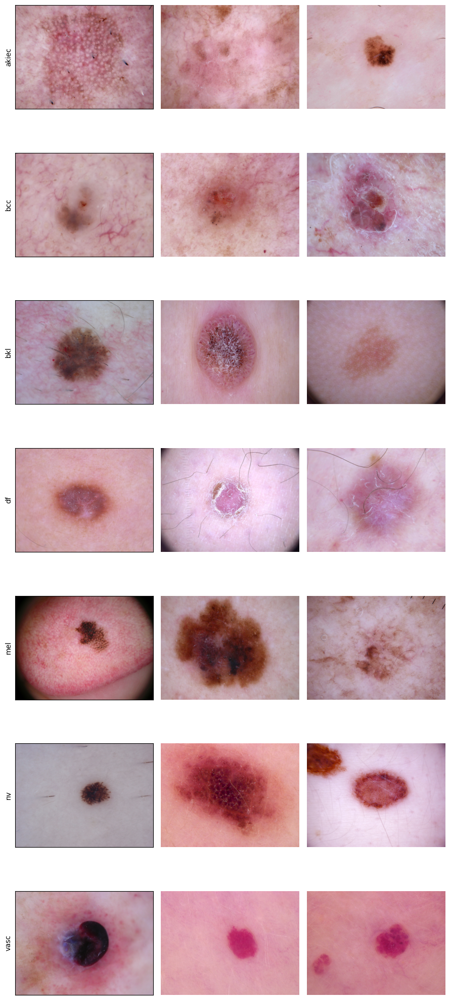


amostra_visual_por_classe
Grade de 3 imagens x 7 classes exibida (seed=42).


In [12]:
amostra_visual_por_classe(df, coluna_classe="dx", n_por_classe=3, seed=SEED)


### 7.2 Imagens corrompidas

Varre o dataset inteiro — pode demorar alguns minutos na primeira vez,
mas é melhor descobrir agora do que no meio do treino.

In [13]:
corrompidas = checar_imagens_corrompidas(df)



checar_imagens_corrompidas
10015 imagens verificadas, 0 corrompidas/ilegíveis.


### 7.3 Distribuição de dimensões (amostra)

In [14]:
distribuicao_dimensoes(df, amostra=500)



distribuicao_dimensoes
500 imagens inspecionadas. 1 combinação(ões) única(s) de (largura, altura, modo):
shape: (1, 3)
┌─────────┬────────┬──────┐
│ largura ┆ altura ┆ modo │
│ ---     ┆ ---    ┆ ---  │
│ i64     ┆ i64    ┆ str  │
╞═════════╪════════╪══════╡
│ 600     ┆ 450    ┆ RGB  │
└─────────┴────────┴──────┘


caminho,largura,altura,modo
str,i64,i64,str
"""/content/projeto_2_cnn_saida/d…",600,450,"""RGB"""
"""/content/projeto_2_cnn_saida/d…",600,450,"""RGB"""
"""/content/projeto_2_cnn_saida/d…",600,450,"""RGB"""
"""/content/projeto_2_cnn_saida/d…",600,450,"""RGB"""
"""/content/projeto_2_cnn_saida/d…",600,450,"""RGB"""
…,…,…,…
"""/content/projeto_2_cnn_saida/d…",600,450,"""RGB"""
"""/content/projeto_2_cnn_saida/d…",600,450,"""RGB"""
"""/content/projeto_2_cnn_saida/d…",600,450,"""RGB"""


### 7.4 Estatísticas de pixel (média/desvio RGB)

Insumo direto para a normalização em `montar_transform`/`preparar_dataloaders`
— usa as estatísticas REAIS deste dataset, não os valores padrão do ImageNet.

In [15]:
stats_pixel = estatisticas_pixel(df, amostra=200, seed=SEED)
MEDIA_RGB = stats_pixel["media_rgb"]
DESVIO_RGB = stats_pixel["desvio_rgb"]
stats_pixel



estatisticas_pixel
Sobre 200 imagens: média RGB=(np.float64(0.772), np.float64(0.5548), np.float64(0.5716)), desvio RGB=(np.float64(0.1427), np.float64(0.1585), np.float64(0.1745)).


{'media_rgb': (np.float64(0.772), np.float64(0.5548), np.float64(0.5716)),
 'desvio_rgb': (np.float64(0.1427), np.float64(0.1585), np.float64(0.1745)),
 'n_imagens_amostradas': 200}

## 8. DataLoaders PyTorch

Resize direto para o quadrado (distorce a proporção 4:3 original — decisão
de simplicidade, documentada em `data.montar_transform`), normalizado com
`MEDIA_RGB`/`DESVIO_RGB` calculados na seção 7.4.

`aumentar_treino=True`: só o split de TREINO recebe augmentation geométrico
(flip horizontal/vertical, rotação, translação/escala leves) — lesões de
pele não têm orientação canônica, então essas transformações preservam o
rótulo. Val/test usam sempre o transform sem augmentation. Como os
`dataloaders` são construídos uma única vez aqui e reaproveitados por
TODOS os modelos treinados a seguir (CNN de referência, variante residual,
LSTM sobre patches), a comparação entre arquiteturas nas seções 10 e 11
continua isolando só a arquitetura — todas se beneficiam igualmente da
augmentation.

In [16]:
BATCH_SIZE = 32
dataloaders = preparar_dataloaders(df, MEDIA_RGB, DESVIO_RGB, batch_size=BATCH_SIZE, tamanho=128, num_workers=2, aumentar_treino=True)

df_treino = df.filter(pl.col("split") == "train")
df_val = df.filter(pl.col("split") == "val")
df_teste = df.filter(pl.col("split") == "test")



preparar_dataloaders
DataLoaders prontos — batch_size=32, tamanho=128x128, augmentation no treino=ativo. Tamanhos: train=7001, val=1525, test=1489


## 9. Baseline não trivial (scikit-learn)

Em vez de pixel bruto, extrai features artesanais que correspondem a
critérios clínicos reais de avaliação de lesão de pele (histograma de cor
+ textura LBP) e treina uma regressão logística por cima — compara
"conhecimento de domínio codificado à mão" vs. "features aprendidas
automaticamente pela CNN" (seção 10), não só "simples vs. complexo".

A extração de features roda imagem a imagem em Python puro — mais lenta
que o carregamento via `DataLoader` da CNN; para o dataset completo pode
levar alguns minutos por split.

In [17]:
X_treino_bl, y_treino_bl = construir_matriz_features(df_treino)
X_val_bl, y_val_bl = construir_matriz_features(df_val)
X_teste_bl, y_teste_bl = construir_matriz_features(df_teste)



construir_matriz_features
Features extraídas: X.shape=(7001, 58), 7 classes.

construir_matriz_features
Features extraídas: X.shape=(1525, 58), 7 classes.

construir_matriz_features
Features extraídas: X.shape=(1489, 58), 7 classes.



treinar_baseline
Acurácia no treino: 0.5688

treinar_baseline
Acurácia na validação: 0.5744

metricas
F1-macro=0.3392
              precision    recall  f1-score   support

       akiec       0.18      0.47      0.27        36
         bcc       0.21      0.44      0.29        59
         bkl       0.27      0.35      0.30       159
          df       0.05      0.38      0.09        16
         mel       0.34      0.46      0.39       159
          nv       0.94      0.60      0.74      1043
        vasc       0.19      0.76      0.31        17

    accuracy                           0.55      1489
   macro avg       0.31      0.49      0.34      1489
weighted avg       0.74      0.55      0.61      1489



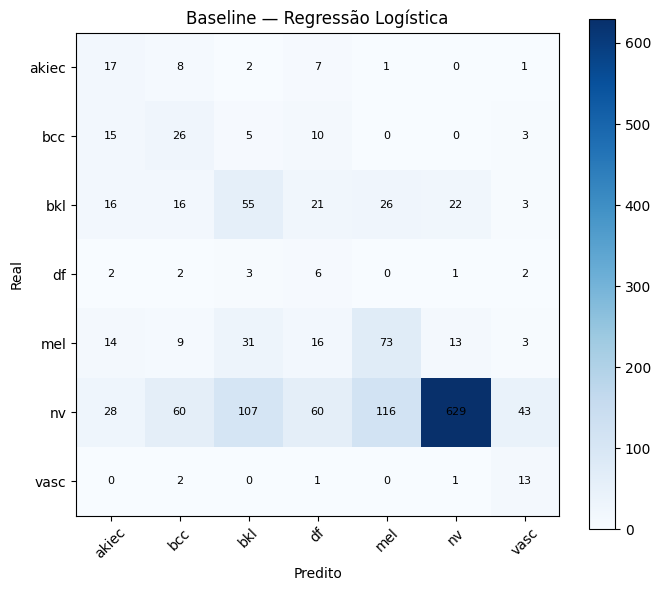

(0.3391595143401303, 0.5500335795836132)

In [18]:
resultado_baseline = treinar_baseline(X_treino_bl, y_treino_bl, X_val_bl, y_val_bl)
metricas_baseline = avaliar_baseline(resultado_baseline, X_teste_bl, y_teste_bl, CLASSES)
plotar_matriz_confusao(metricas_baseline["matriz_confusao"], CLASSES, titulo="Baseline — Regressão Logística", salvar_dir=DIR_REPORT_ASSETS, nome_modelo="baseline")

registrar_experimento(
    nome="baseline_logistica",
    tipo="baseline",
    hiperparametros={"modelo": "LogisticRegression", "class_weight": "balanced", "features": "cor+LBP (58-d)"},
    metricas={"f1_macro": metricas_baseline["f1_macro"], "accuracy": metricas_baseline["accuracy"]},
    notas="Referência mínima — medição única, sem busca de hiperparâmetros.",
)
metricas_baseline["f1_macro"], metricas_baseline["accuracy"]


## 10. CNN de referência

Arquitetura v1: 4 blocos convolucionais (16→32→64→128 filtros), Global
Average Pooling em vez de Flatten+Dense (evita milhões de parâmetros numa
única camada densa, dado o tamanho modesto do dataset), Dropout2d espacial
dentro dos blocos + Dropout comum antes da saída — ver `models.CNNLesaoPele`.

### 10.1 Pesos de classe + treino

A seção 10.5 treina uma segunda arquitetura (`CNNLesaoPeleResidual`, com conexões de atalho e mais parâmetros) sob a MESMA infraestrutura — mesmos DataLoaders, mesma ponderação de classe, mesmos hiperparâmetros de treino — para um teste controlado, comparando só a arquitetura, não uma dúzia de fatores ao mesmo tempo.

In [19]:
pesos_classe = computar_pesos_classe(df_treino)
modelo_cnn = criar_cnn_padrao(num_classes=len(CLASSES))

CHECKPOINT_CNN = os.path.join(DIR_CHECKPOINTS, f"cnn_{RUN_ID}")
historico_cnn = treinar_modelo(
    modelo_cnn,
    dataloaders,
    pesos_classe,
    nome_experimento=f"cnn_{RUN_ID}",
    checkpoint_dir=DIR_CHECKPOINTS,
    dir_runs=DIR_RUNS,
    epochs=30,
    lr=1e-3,
    weight_decay=1e-4,
    paciencia_early_stopping=7,
    device=DEVICE,
    clip_grad_norm_max=5.0,
)



computar_pesos_classe
Pesos por classe: akiec=4.00, bcc=2.63, bkl=1.31, df=12.99, mel=1.28, nv=0.21, vasc=10.64

treinar_modelo
Treino de 'cnn_20260829_203117' em cuda (AMP ativo), até 30 épocas (retomando da época 1).
[cnn_20260829_203117] época 1/30 — train_loss=1.8680 val_loss=1.1984 grad_norm=3.6993 overflow=1batches (71.2s)
[cnn_20260829_203117] época 2/30 — train_loss=1.7046 val_loss=1.2811 grad_norm=2.6725 (32.9s)
[cnn_20260829_203117] época 3/30 — train_loss=1.5975 val_loss=1.2617 grad_norm=2.8746 overflow=1batches (33.3s)
[cnn_20260829_203117] época 4/30 — train_loss=1.5327 val_loss=1.4944 grad_norm=2.8799 (33.4s)
[cnn_20260829_203117] época 5/30 — train_loss=1.5292 val_loss=1.1532 grad_norm=2.6832 (33.0s)
[cnn_20260829_203117] época 6/30 — train_loss=1.4716 val_loss=1.1488 grad_norm=2.6980 overflow=1batches (32.8s)
[cnn_20260829_203117] época 7/30 — train_loss=1.4616 val_loss=1.2998 grad_norm=2.6522 (33.0s)
[cnn_20260829_203117] época 8/30 — train_loss=1.4178 val_loss=1.1588

### 10.2 Diagnóstico de treino

In [20]:
modelo_cnn = carregar_melhor_modelo(modelo_cnn, os.path.join(DIR_CHECKPOINTS, f"cnn_{RUN_ID}.pt"), device=DEVICE)

plot_curvas_loss(historico_cnn, "cnn", salvar_dir=DIR_REPORT_ASSETS)
plot_gradient_norm(historico_cnn, "cnn", salvar_dir=DIR_REPORT_ASSETS)


Modelo recarregado com sucesso de '/content/projeto_2_cnn_saida/outputs/checkpoints/cnn_20260829_203117.pt'.

NOTA: [cnn] Rótulo de loss sugerido: Instabilidade (alta variância época a época na validação). Loss final — treino: 1.2067, validação: 0.9906, gap: -0.2160. Confirme visualmente antes de citar no relatório.

NOTA: [cnn] Gradient norm - média: 2.7753, min: 2.5418, máx: 3.6993. 4 batch(es) com overflow de AMP ao longo do treino (grad_norm não finita)


'/content/projeto_2_cnn_saida/outputs/report_assets/grad_norm_cnn.png'

### 10.3 Avaliação final (conjunto de teste)


metricas
F1-macro=0.4127
              precision    recall  f1-score   support

       akiec       0.17      0.53      0.25        36
         bcc       0.22      0.47      0.30        59
         bkl       0.32      0.41      0.36       159
          df       0.07      0.19      0.11        16
         mel       0.40      0.47      0.43       159
          nv       0.93      0.71      0.80      1043
        vasc       0.52      0.82      0.64        17

    accuracy                           0.63      1489
   macro avg       0.38      0.51      0.41      1489
weighted avg       0.75      0.63      0.67      1489



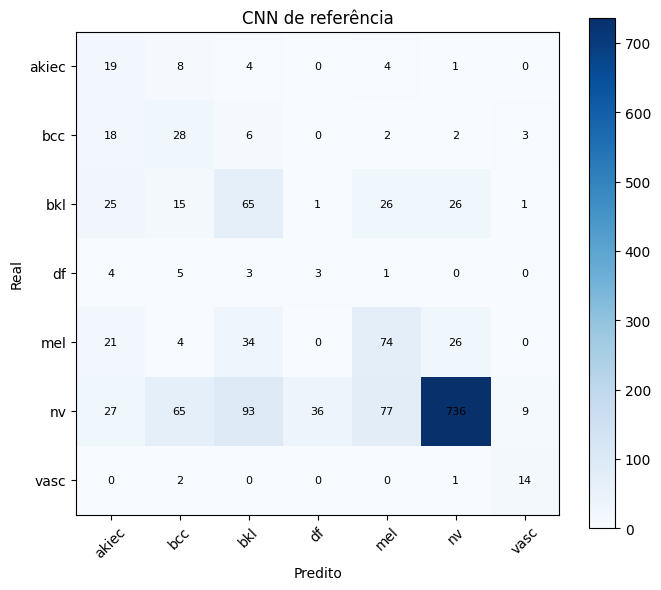

(0.41267495282551747, 0.6306245802552048)

In [21]:
metricas_cnn = avaliar_cnn(modelo_cnn, dataloaders["test"], CLASSES, device=DEVICE)
plotar_matriz_confusao(metricas_cnn["matriz_confusao"], CLASSES, titulo="CNN de referência", salvar_dir=DIR_REPORT_ASSETS, nome_modelo=f"cnn_{RUN_ID}")

registrar_experimento(
    nome=f"cnn_{RUN_ID}",
    tipo="cnn",
    hiperparametros={"filtros": [16, 32, 64, 128], "dropout2d": 0.1, "dropout_final": 0.3, "batch_size": BATCH_SIZE, "lr": 1e-3},
    metricas={"f1_macro": metricas_cnn["f1_macro"], "accuracy": metricas_cnn["accuracy"]},
    notas="Comparar com baseline_logistica (seção 9).",
)
metricas_cnn["f1_macro"], metricas_cnn["accuracy"]


### 10.4 Interpretação de erro

Pares (classe real, classe predita) mais frequentes de erro, com exemplos
visuais — insumo direto para discutir onde o modelo confunde lesões
clinicamente parecidas.


exemplos_classificados_errado
550 erros de 1489 avaliados. Pares (real, predito) mais frequentes:
shape: (10, 3)
┌─────┬─────────┬─────┐
│ dx  ┆ predito ┆ n   │
│ --- ┆ ---     ┆ --- │
│ str ┆ str     ┆ u32 │
╞═════╪═════════╪═════╡
│ nv  ┆ bkl     ┆ 93  │
│ nv  ┆ mel     ┆ 77  │
│ nv  ┆ bcc     ┆ 65  │
│ nv  ┆ df      ┆ 36  │
│ mel ┆ bkl     ┆ 34  │
│ nv  ┆ akiec   ┆ 27  │
│ mel ┆ nv      ┆ 26  │
│ bkl ┆ nv      ┆ 26  │
│ bkl ┆ mel     ┆ 26  │
│ bkl ┆ akiec   ┆ 25  │
└─────┴─────────┴─────┘


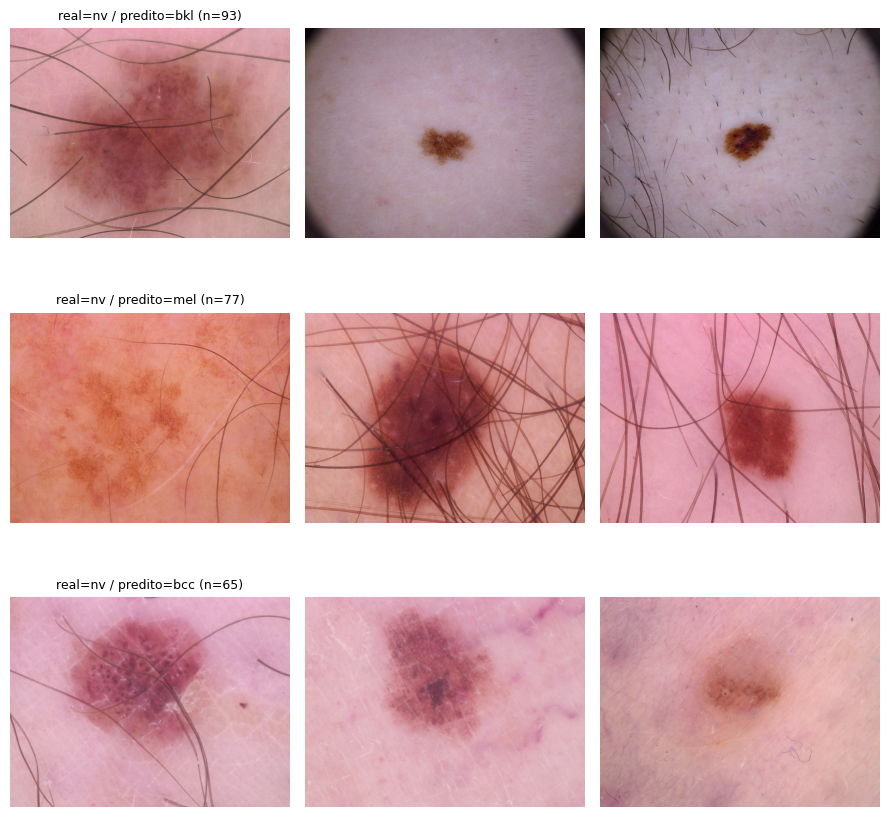

In [22]:
transform_avaliacao = montar_transform(MEDIA_RGB, DESVIO_RGB, tamanho=128)
df_erros_cnn = exemplos_classificados_errado(modelo_cnn, df_teste, transform_avaliacao, CLASSES, n_por_par=3, device=DEVICE)


### 10.5 Arquitetura alternativa — CNN residual (teste controlado)

`CNNLesaoPeleResidual`: entrada com stride maior + 4 blocos convolucionais organizados em 2 estágios, cada estágio fechado por uma conexão de atalho (projeção 1x1) somada à saída — ajuda o gradiente a fluir por uma rede mais funda sem se dissipar. Também troca GAP direto pra saída (como a referência) por GAP + uma camada densa oculta (256 → 128) antes da saída — mais capacidade de decisão não-linear no topo, ao custo de mais parâmetros treináveis. Mesmos hiperparâmetros de treino da seção 10.1, de propósito — a única variável isolada aqui é a arquitetura.

In [23]:
modelo_cnn_residual = criar_cnn_residual(num_classes=len(CLASSES))

CHECKPOINT_CNN_RESIDUAL = os.path.join(DIR_CHECKPOINTS, f"cnn_residual_{RUN_ID}")
historico_cnn_residual = treinar_modelo(
    modelo_cnn_residual,
    dataloaders,
    pesos_classe,
    nome_experimento=f"cnn_residual_{RUN_ID}",
    checkpoint_dir=DIR_CHECKPOINTS,
    dir_runs=DIR_RUNS,
    epochs=30,
    lr=1e-3,
    weight_decay=1e-4,
    paciencia_early_stopping=7,
    device=DEVICE,
    clip_grad_norm_max=5.0,
)



treinar_modelo
Treino de 'cnn_residual_20260829_203117' em cuda (AMP ativo), até 30 épocas (retomando da época 1).
[cnn_residual_20260829_203117] época 1/30 — train_loss=3.1844 val_loss=1.2376 grad_norm=20.3850 overflow=4batches (52.0s)
[cnn_residual_20260829_203117] época 2/30 — train_loss=1.9116 val_loss=1.4530 grad_norm=7.8442 (33.1s)
[cnn_residual_20260829_203117] época 3/30 — train_loss=1.7274 val_loss=1.2324 grad_norm=5.2707 (33.1s)
[cnn_residual_20260829_203117] época 4/30 — train_loss=1.6277 val_loss=1.1978 grad_norm=4.1377 (33.2s)
[cnn_residual_20260829_203117] época 5/30 — train_loss=1.5485 val_loss=1.3042 grad_norm=3.7535 (32.8s)
[cnn_residual_20260829_203117] época 6/30 — train_loss=1.5026 val_loss=1.2503 grad_norm=3.4371 (33.1s)
[cnn_residual_20260829_203117] época 7/30 — train_loss=1.4987 val_loss=1.2633 grad_norm=3.2852 (33.0s)
[cnn_residual_20260829_203117] época 8/30 — train_loss=1.4310 val_loss=1.1516 grad_norm=3.0439 (33.0s)
[cnn_residual_20260829_203117] época 9/30

#### Diagnóstico de treino (arquitetura residual)

In [24]:
modelo_cnn_residual = carregar_melhor_modelo(modelo_cnn_residual, os.path.join(DIR_CHECKPOINTS, f"cnn_residual_{RUN_ID}.pt"), device=DEVICE)

plot_curvas_loss(historico_cnn_residual, "cnn_residual", salvar_dir=DIR_REPORT_ASSETS)
plot_gradient_norm(historico_cnn_residual, "cnn_residual", salvar_dir=DIR_REPORT_ASSETS)


Modelo recarregado com sucesso de '/content/projeto_2_cnn_saida/outputs/checkpoints/cnn_residual_20260829_203117.pt'.

NOTA: [cnn_residual] Rótulo de loss sugerido: Convergência aparentemente saudável. Loss final — treino: 1.2742, validação: 1.0338, gap: -0.2404. Confirme visualmente antes de citar no relatório.

NOTA: [cnn_residual] Gradient norm - média: 4.1858, min: 2.6412, máx: 20.3850. 4 batch(es) com overflow de AMP ao longo do treino (grad_norm não finita)


'/content/projeto_2_cnn_saida/outputs/report_assets/grad_norm_cnn_residual.png'

#### Avaliação final (conjunto de teste) — arquitetura residual


metricas
F1-macro=0.3919
              precision    recall  f1-score   support

       akiec       0.12      0.61      0.20        36
         bcc       0.33      0.37      0.35        59
         bkl       0.40      0.36      0.38       159
          df       0.11      0.19      0.14        16
         mel       0.28      0.57      0.38       159
          nv       0.93      0.63      0.75      1043
        vasc       0.41      0.82      0.55        17

    accuracy                           0.58      1489
   macro avg       0.37      0.51      0.39      1489
weighted avg       0.75      0.58      0.64      1489



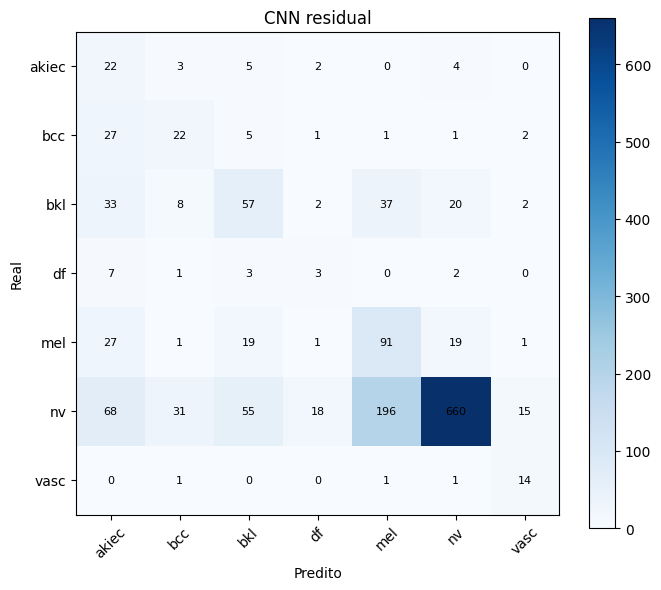

(0.3919345586824671, 0.5836131631967764)

In [25]:
metricas_cnn_residual = avaliar_cnn(modelo_cnn_residual, dataloaders["test"], CLASSES, device=DEVICE)
plotar_matriz_confusao(metricas_cnn_residual["matriz_confusao"], CLASSES, titulo="CNN residual", salvar_dir=DIR_REPORT_ASSETS, nome_modelo=f"cnn_residual_{RUN_ID}")

n_parametros_padrao = sum(p.numel() for p in modelo_cnn.parameters())
n_parametros_residual = sum(p.numel() for p in modelo_cnn_residual.parameters())

registrar_experimento(
    nome=f"cnn_residual_{RUN_ID}",
    tipo="cnn",
    hiperparametros={"arquitetura": "residual", "dropout2d": 0.25, "batch_size": BATCH_SIZE, "lr": 1e-3, "n_parametros": n_parametros_residual},
    metricas={"f1_macro": metricas_cnn_residual["f1_macro"], "accuracy": metricas_cnn_residual["accuracy"]},
    notas=f"Teste controlado contra a CNN de referência (mesmos DataLoaders/hiperparâmetros) — {n_parametros_residual:,} parâmetros vs. {n_parametros_padrao:,} da referência.",
)
metricas_cnn_residual["f1_macro"], metricas_cnn_residual["accuracy"]


#### Comparação — CNN de referência vs. CNN residual

As duas arquiteturas foram treinadas com os MESMOS DataLoaders (augmentation inclusive), a mesma ponderação de classe e os mesmos hiperparâmetros de otimização — a única variável isolada é a arquitetura em si. Vale mais como decisão empírica do que teórica: a arquitetura residual tem ~3,5x mais parâmetros; se o F1 não melhorar proporcionalmente (ou piorar), é sinal de overfitting pela capacidade extra num dataset de só ~10 mil imagens.

In [26]:
comparacao_arquiteturas = pl.DataFrame([
    {"modelo": "Baseline (regressão logística)", "f1_macro": metricas_baseline["f1_macro"], "accuracy": metricas_baseline["accuracy"], "n_parametros": None},
    {"modelo": "CNN de referência", "f1_macro": metricas_cnn["f1_macro"], "accuracy": metricas_cnn["accuracy"], "n_parametros": n_parametros_padrao},
    {"modelo": "CNN residual", "f1_macro": metricas_cnn_residual["f1_macro"], "accuracy": metricas_cnn_residual["accuracy"], "n_parametros": n_parametros_residual},
])
log_etapa("Comparação de arquiteturas - CNN de referência vs. CNN residual", comparacao_arquiteturas)

delta_f1_residual = metricas_cnn_residual["f1_macro"] - metricas_cnn["f1_macro"]
comentario_residual = (
    "A arquitetura residual superou a referência - a capacidade extra (conexões de atalho + camada densa oculta) ajudou."
    if delta_f1_residual > 0.01 else
    "A arquitetura residual não superou a referência de forma relevante, apesar de ter bem mais parâmetros - "
    "sinal de que a capacidade extra não estava sendo o fator limitante (ou está overfitando) neste dataset."
    if delta_f1_residual <= 0.01 and abs(delta_f1_residual) <= 0.02 else
    "A arquitetura residual teve F1 pior que a referência - provável overfitting pela capacidade extra num dataset de ~10 mil imagens."
)
log_nota(
    f"CNN de referência vs. residual: f1_macro referência={metricas_cnn['f1_macro']:.4f} "
    f"({n_parametros_padrao:,} parâmetros), residual={metricas_cnn_residual['f1_macro']:.4f} "
    f"({n_parametros_residual:,} parâmetros) — delta={delta_f1_residual:+.4f}. {comentario_residual}"
)
comparacao_arquiteturas



Comparação de arquiteturas - CNN de referência vs. CNN residual
shape: (3, 4)
┌────────────────────────────────┬──────────┬──────────┬──────────────┐
│ modelo                         ┆ f1_macro ┆ accuracy ┆ n_parametros │
│ ---                            ┆ ---      ┆ ---      ┆ ---          │
│ str                            ┆ f64      ┆ f64      ┆ i64          │
╞════════════════════════════════╪══════════╪══════════╪══════════════╡
│ Baseline (regressão logística) ┆ 0.33916  ┆ 0.550034 ┆ null         │
│ CNN de referência              ┆ 0.412675 ┆ 0.630625 ┆ 295383       │
│ CNN residual                   ┆ 0.391935 ┆ 0.583613 ┆ 1054503      │
└────────────────────────────────┴──────────┴──────────┴──────────────┘

NOTA: CNN de referência vs. residual: f1_macro referência=0.4127 (295,383 parâmetros), residual=0.3919 (1,054,503 parâmetros) — delta=-0.0207. A arquitetura residual teve F1 pior que a referência - provável overfitting pela capacidade extra num dataset de ~10 mil imagens.

modelo,f1_macro,accuracy,n_parametros
str,f64,f64,i64
"""Baseline (regressão logística)""",0.33916,0.550034,null
"""CNN de referência""",0.412675,0.630625,295383
"""CNN residual""",0.391935,0.583613,1054503


### 10.6 Busca de estratégias contra o padrão de erro atual

Três variações da arquitetura de REFERÊNCIA (não a residual — isola o efeito de cada estratégia da pergunta já respondida em 10.5), cada uma mudando UMA coisa só em relação a 10.1:

- **Focal Loss**: ataca diretamente o desbalanceamento de classes (nv domina ~67% do HAM10000) — reduz a contribuição de exemplos já bem classificados no gradiente, em vez de só reponderar a magnitude do erro por classe como a CrossEntropyLoss ponderada já faz. "Quase de graça": mesma arquitetura, mesmo orçamento de épocas, só troca o critério de perda.
- **Mais épocas/paciência**: a augmentation (seção 8) e a comparação de arquiteturas (10.5) foram calibradas com `epochs=30`/`paciencia_early_stopping=7` — valores pensados para quando não havia augmentation. Garante que o modelo não pare cedo demais agora que o treino ficou mais difícil por design.
- **Resolução maior** (mais cara — rode por último, se sobrar tempo): 224x224 em vez de 128x128, para capturar detalhe fino (irregularidade de borda, textura) que pode se perder no downscale atual.

Mesma disciplina do projeto 1: as três comparadas por loss de VALIDAÇÃO (`tipo="busca_cnn"`, nunca tocam o teste) — só a vencedora entre elas é avaliada no conjunto de teste, ao final.

#### 10.6.1 Variação — Focal Loss

In [27]:
criterio_focal = FocalLoss(alpha=pesos_classe.to(DEVICE), gamma=2.0)

modelo_cnn_focal = criar_cnn_padrao(num_classes=len(CLASSES))
historico_cnn_focal = treinar_modelo(
    modelo_cnn_focal,
    dataloaders,
    pesos_classe,
    nome_experimento=f"cnn_focal_loss_{RUN_ID}",
    checkpoint_dir=DIR_CHECKPOINTS,
    dir_runs=DIR_RUNS,
    epochs=30,
    lr=1e-3,
    weight_decay=1e-4,
    paciencia_early_stopping=7,
    device=DEVICE,
    clip_grad_norm_max=5.0,
    criterio=criterio_focal,
)

melhor_val_loss_focal = min(historico_cnn_focal["val_loss"])
registrar_experimento(
    nome=f"cnn_focal_loss_{RUN_ID}",
    tipo="busca_cnn",
    hiperparametros={"estrategia": "focal_loss", "gamma": 2.0, "epochs": 30, "paciencia_early_stopping": 7},
    metricas={"melhor_val_loss": melhor_val_loss_focal, "val_loss_final": historico_cnn_focal["val_loss"][-1]},
    notas="Comparação por validação — teste ainda não avaliado.",
)
print(f"Focal Loss: melhor_val_loss={melhor_val_loss_focal:.4f}")



treinar_modelo
Treino de 'cnn_focal_loss_20260829_203117' em cuda (AMP ativo), até 30 épocas (retomando da época 1).
[cnn_focal_loss_20260829_203117] época 1/30 — train_loss=1.4537 val_loss=0.8949 grad_norm=3.7385 overflow=1batches (33.3s)
[cnn_focal_loss_20260829_203117] época 2/30 — train_loss=1.1952 val_loss=0.9452 grad_norm=3.2562 overflow=1batches (33.0s)
[cnn_focal_loss_20260829_203117] época 3/30 — train_loss=1.1236 val_loss=0.9297 grad_norm=2.8081 (33.2s)
[cnn_focal_loss_20260829_203117] época 4/30 — train_loss=1.0473 val_loss=0.8587 grad_norm=2.7139 overflow=1batches (33.3s)
[cnn_focal_loss_20260829_203117] época 5/30 — train_loss=1.0243 val_loss=0.9033 grad_norm=2.8677 (32.8s)
[cnn_focal_loss_20260829_203117] época 6/30 — train_loss=1.0232 val_loss=0.8746 grad_norm=2.7369 (33.0s)
[cnn_focal_loss_20260829_203117] época 7/30 — train_loss=0.9881 val_loss=0.7972 grad_norm=2.5377 (33.4s)
[cnn_focal_loss_20260829_203117] época 8/30 — train_loss=0.9691 val_loss=0.8958 grad_norm=2.6

#### 10.6.2 Variação — mais épocas/paciência

In [28]:
modelo_cnn_mais_epocas = criar_cnn_padrao(num_classes=len(CLASSES))
historico_cnn_mais_epocas = treinar_modelo(
    modelo_cnn_mais_epocas,
    dataloaders,
    pesos_classe,
    nome_experimento=f"cnn_mais_epocas_{RUN_ID}",
    checkpoint_dir=DIR_CHECKPOINTS,
    dir_runs=DIR_RUNS,
    epochs=60,
    lr=1e-3,
    weight_decay=1e-4,
    paciencia_early_stopping=15,
    device=DEVICE,
    clip_grad_norm_max=5.0,
)

melhor_val_loss_mais_epocas = min(historico_cnn_mais_epocas["val_loss"])
registrar_experimento(
    nome=f"cnn_mais_epocas_{RUN_ID}",
    tipo="busca_cnn",
    hiperparametros={"estrategia": "mais_epocas_paciencia", "epochs": 60, "paciencia_early_stopping": 15},
    metricas={"melhor_val_loss": melhor_val_loss_mais_epocas, "val_loss_final": historico_cnn_mais_epocas["val_loss"][-1]},
    notas="Comparação por validação — teste ainda não avaliado.",
)
print(f"Mais épocas/paciência: melhor_val_loss={melhor_val_loss_mais_epocas:.4f}")



treinar_modelo
Treino de 'cnn_mais_epocas_20260829_203117' em cuda (AMP ativo), até 60 épocas (retomando da época 1).
[cnn_mais_epocas_20260829_203117] época 1/60 — train_loss=1.9460 val_loss=1.3729 grad_norm=3.5250 overflow=1batches (33.3s)
[cnn_mais_epocas_20260829_203117] época 2/60 — train_loss=1.6681 val_loss=1.4649 grad_norm=2.8565 (33.4s)
[cnn_mais_epocas_20260829_203117] época 3/60 — train_loss=1.6077 val_loss=1.1833 grad_norm=2.9279 overflow=1batches (33.1s)
[cnn_mais_epocas_20260829_203117] época 4/60 — train_loss=1.5706 val_loss=1.2697 grad_norm=2.7117 (33.3s)
[cnn_mais_epocas_20260829_203117] época 5/60 — train_loss=1.5341 val_loss=1.3292 grad_norm=2.9244 overflow=1batches (33.5s)
[cnn_mais_epocas_20260829_203117] época 6/60 — train_loss=1.4796 val_loss=1.2935 grad_norm=2.7586 (33.8s)
[cnn_mais_epocas_20260829_203117] época 7/60 — train_loss=1.4932 val_loss=1.2742 grad_norm=2.7707 (32.9s)
[cnn_mais_epocas_20260829_203117] época 8/60 — train_loss=1.4019 val_loss=1.3167 grad

#### 10.6.3 Variação — resolução maior (opcional, mais cara)

`BATCH_SIZE_ALTA_RESOLUCAO` menor que `BATCH_SIZE`: 224x224 usa ~3x mais memória por imagem que 128x128 — reduzir o batch evita estourar memória de GPU. `dataloaders_alta_resolucao` é um conjunto de `DataLoader` à parte (não reaproveita `dataloaders`), com a MESMA augmentation (seção 8), só em resolução maior.

In [29]:
TAMANHO_ALTA_RESOLUCAO = 224
BATCH_SIZE_ALTA_RESOLUCAO = 16

dataloaders_alta_resolucao = preparar_dataloaders(
    df, MEDIA_RGB, DESVIO_RGB, batch_size=BATCH_SIZE_ALTA_RESOLUCAO,
    tamanho=TAMANHO_ALTA_RESOLUCAO, num_workers=2, aumentar_treino=True,
)

modelo_cnn_alta_resolucao = criar_cnn_padrao(num_classes=len(CLASSES))
historico_cnn_alta_resolucao = treinar_modelo(
    modelo_cnn_alta_resolucao,
    dataloaders_alta_resolucao,
    pesos_classe,
    nome_experimento=f"cnn_alta_resolucao_{RUN_ID}",
    checkpoint_dir=DIR_CHECKPOINTS,
    dir_runs=DIR_RUNS,
    epochs=30,
    lr=1e-3,
    weight_decay=1e-4,
    paciencia_early_stopping=7,
    device=DEVICE,
    clip_grad_norm_max=5.0,
)

melhor_val_loss_alta_resolucao = min(historico_cnn_alta_resolucao["val_loss"])
registrar_experimento(
    nome=f"cnn_alta_resolucao_{RUN_ID}",
    tipo="busca_cnn",
    hiperparametros={"estrategia": "resolucao_maior", "tamanho": TAMANHO_ALTA_RESOLUCAO, "batch_size": BATCH_SIZE_ALTA_RESOLUCAO},
    metricas={"melhor_val_loss": melhor_val_loss_alta_resolucao, "val_loss_final": historico_cnn_alta_resolucao["val_loss"][-1]},
    notas="Comparação por validação — teste ainda não avaliado. Mais cara (224x224); rode por último, se sobrar tempo.",
)
print(f"Resolução maior: melhor_val_loss={melhor_val_loss_alta_resolucao:.4f}")



preparar_dataloaders
DataLoaders prontos — batch_size=16, tamanho=224x224, augmentation no treino=ativo. Tamanhos: train=7001, val=1525, test=1489

treinar_modelo
Treino de 'cnn_alta_resolucao_20260829_203117' em cuda (AMP ativo), até 30 épocas (retomando da época 1).
[cnn_alta_resolucao_20260829_203117] época 1/30 — train_loss=1.8412 val_loss=1.2046 grad_norm=3.9623 overflow=2batches (85.4s)
[cnn_alta_resolucao_20260829_203117] época 2/30 — train_loss=1.6783 val_loss=1.2196 grad_norm=3.0395 (39.3s)
[cnn_alta_resolucao_20260829_203117] época 3/30 — train_loss=1.6373 val_loss=1.1659 grad_norm=3.4483 overflow=1batches (39.4s)
[cnn_alta_resolucao_20260829_203117] época 4/30 — train_loss=1.5777 val_loss=1.2013 grad_norm=3.1861 (39.6s)
[cnn_alta_resolucao_20260829_203117] época 5/30 — train_loss=1.5797 val_loss=1.2483 grad_norm=3.3935 (39.0s)
[cnn_alta_resolucao_20260829_203117] época 6/30 — train_loss=1.5176 val_loss=1.1407 grad_norm=3.6156 overflow=1batches (39.2s)
[cnn_alta_resolucao_20

#### 10.6.4 Vencedora entre as estratégias → avaliação final (conjunto de teste)


NOTA: Vencedora entre as estratégias testadas (Focal Loss / mais épocas-paciência / resolução maior): 'cnn_focal_loss_20260829_203117' (melhor_val_loss=0.6420).

metricas
F1-macro=0.3505
              precision    recall  f1-score   support

       akiec       0.12      0.69      0.21        36
         bcc       0.17      0.36      0.23        59
         bkl       0.28      0.47      0.35       159
          df       0.05      0.19      0.08        16
         mel       0.33      0.33      0.33       159
          nv       0.95      0.58      0.72      1043
        vasc       0.39      0.82      0.53        17

    accuracy                           0.54      1489
   macro avg       0.33      0.49      0.35      1489
weighted avg       0.74      0.54      0.60      1489



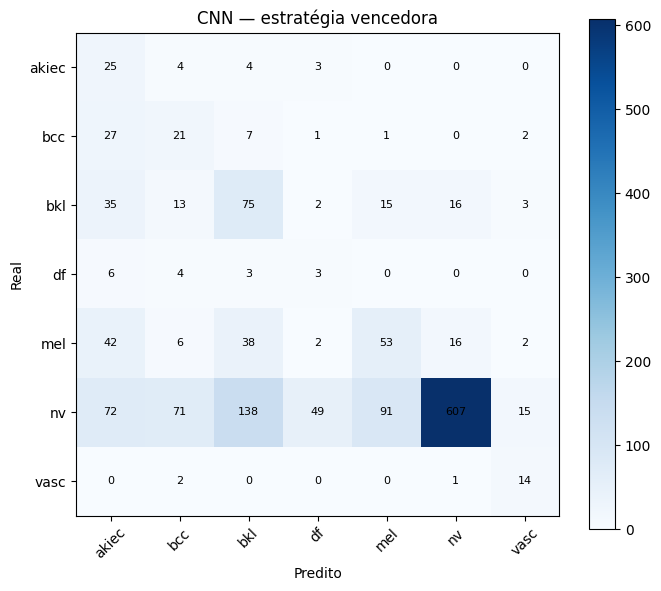

(0.3505338354577029, 0.5359301544660846)

In [30]:
candidatos_estrategias = [
    {"nome": f"cnn_focal_loss_{RUN_ID}", "modelo": modelo_cnn_focal, "melhor_val_loss": melhor_val_loss_focal, "dataloaders": dataloaders},
    {"nome": f"cnn_mais_epocas_{RUN_ID}", "modelo": modelo_cnn_mais_epocas, "melhor_val_loss": melhor_val_loss_mais_epocas, "dataloaders": dataloaders},
    {"nome": f"cnn_alta_resolucao_{RUN_ID}", "modelo": modelo_cnn_alta_resolucao, "melhor_val_loss": melhor_val_loss_alta_resolucao, "dataloaders": dataloaders_alta_resolucao},
]
melhor_estrategia = min(candidatos_estrategias, key=lambda r: r["melhor_val_loss"])
log_nota(
    f"Vencedora entre as estratégias testadas (Focal Loss / mais épocas-paciência / "
    f"resolução maior): '{melhor_estrategia['nome']}' (melhor_val_loss={melhor_estrategia['melhor_val_loss']:.4f})."
)

metricas_cnn_estrategia_vencedora = avaliar_cnn(
    melhor_estrategia["modelo"], melhor_estrategia["dataloaders"]["test"], CLASSES, device=DEVICE
)
plotar_matriz_confusao(
    metricas_cnn_estrategia_vencedora["matriz_confusao"], CLASSES,
    titulo="CNN — estratégia vencedora", salvar_dir=DIR_REPORT_ASSETS, nome_modelo=melhor_estrategia["nome"],
)

registrar_experimento(
    nome=f"{melhor_estrategia['nome']}_final",
    tipo="cnn",
    hiperparametros={"vencedora_da_busca_de_estrategias": melhor_estrategia["nome"]},
    metricas={"f1_macro": metricas_cnn_estrategia_vencedora["f1_macro"], "accuracy": metricas_cnn_estrategia_vencedora["accuracy"]},
    notas=f"Vencedora entre Focal Loss / mais épocas-paciência / resolução maior — comparar com cnn_{RUN_ID} (referência) e baseline_logistica.",
)
metricas_cnn_estrategia_vencedora["f1_macro"], metricas_cnn_estrategia_vencedora["accuracy"]


#### 10.6.5 Comparação — baseline, referência e as três estratégias

In [31]:
comparacao_estrategias = pl.DataFrame([
    {"opcao": "Baseline (regressão logística)", "melhor_val_loss": None, "f1_macro_teste": metricas_baseline["f1_macro"]},
    {"opcao": "CNN de referência", "melhor_val_loss": None, "f1_macro_teste": metricas_cnn["f1_macro"]},
    {"opcao": "Focal Loss", "melhor_val_loss": melhor_val_loss_focal, "f1_macro_teste": None},
    {"opcao": "Mais épocas/paciência", "melhor_val_loss": melhor_val_loss_mais_epocas, "f1_macro_teste": None},
    {"opcao": "Resolução maior", "melhor_val_loss": melhor_val_loss_alta_resolucao, "f1_macro_teste": None},
    {"opcao": f"Vencedora ({melhor_estrategia['nome']})", "melhor_val_loss": melhor_estrategia["melhor_val_loss"], "f1_macro_teste": metricas_cnn_estrategia_vencedora["f1_macro"]},
])
log_etapa("Comparação das estratégias testadas contra o padrão de erro", comparacao_estrategias)
comparacao_estrategias



Comparação das estratégias testadas contra o padrão de erro
shape: (6, 3)
┌─────────────────────────────────┬─────────────────┬────────────────┐
│ opcao                           ┆ melhor_val_loss ┆ f1_macro_teste │
│ ---                             ┆ ---             ┆ ---            │
│ str                             ┆ f64             ┆ f64            │
╞═════════════════════════════════╪═════════════════╪════════════════╡
│ Baseline (regressão logística)  ┆ null            ┆ 0.33916        │
│ CNN de referência               ┆ null            ┆ 0.412675       │
│ Focal Loss                      ┆ 0.641983        ┆ null           │
│ Mais épocas/paciência           ┆ 0.939713        ┆ null           │
│ Resolução maior                 ┆ 1.005554        ┆ null           │
│ Vencedora (cnn_focal_loss_2026… ┆ 0.641983        ┆ 0.350534       │
└─────────────────────────────────┴─────────────────┴────────────────┘


opcao,melhor_val_loss,f1_macro_teste
str,f64,f64
"""Baseline (regressão logística)""",null,0.33916
"""CNN de referência""",null,0.412675
"""Focal Loss""",0.641983,null
"""Mais épocas/paciência""",0.939713,null
"""Resolução maior""",1.005554,null
"""Vencedora (cnn_focal_loss_2026…",0.641983,0.350534


## 11. Variante ilustrativa — LSTM sobre patches (Etapa 2)

Implementação simplificada de Abohashish et al. (2025): a imagem é dividida
em patches, cada patch vira um vetor via uma camada linear (não uma CNN por
patch, como no artigo original — simplificação deliberada), a sequência de
patches passa por uma LSTM, e o estado oculto final alimenta o
classificador. **Teste ilustrativo**, não uma tentativa de superar a CNN da
seção 10 — ver `models.PatchSequenceLSTM`.

In [32]:
modelo_lstm = criar_lstm_patches_padrao(num_classes=len(CLASSES), tamanho_imagem=128)

historico_lstm = treinar_modelo(
    modelo_lstm,
    dataloaders,
    pesos_classe,
    nome_experimento=f"lstm_patches_{RUN_ID}",
    checkpoint_dir=DIR_CHECKPOINTS,
    dir_runs=DIR_RUNS,
    epochs=20,
    lr=1e-3,
    weight_decay=1e-4,
    paciencia_early_stopping=5,
    device=DEVICE,
    clip_grad_norm_max=5.0,
)

modelo_lstm = carregar_melhor_modelo(modelo_lstm, os.path.join(DIR_CHECKPOINTS, f"lstm_patches_{RUN_ID}.pt"), device=DEVICE)
plot_curvas_loss(historico_lstm, "lstm_patches", salvar_dir=DIR_REPORT_ASSETS)
plot_gradient_norm(historico_lstm, "lstm_patches", salvar_dir=DIR_REPORT_ASSETS)



treinar_modelo
Treino de 'lstm_patches_20260829_203117' em cuda (AMP ativo), até 20 épocas (retomando da época 1).
[lstm_patches_20260829_203117] época 1/20 — train_loss=1.9239 val_loss=1.5462 grad_norm=2.5125 overflow=1batches (33.4s)
[lstm_patches_20260829_203117] época 2/20 — train_loss=1.8562 val_loss=1.5752 grad_norm=2.4726 (33.1s)
[lstm_patches_20260829_203117] época 3/20 — train_loss=1.8522 val_loss=1.4361 grad_norm=2.5985 (32.8s)
[lstm_patches_20260829_203117] época 4/20 — train_loss=1.8512 val_loss=1.5177 grad_norm=2.6036 overflow=1batches (33.0s)
[lstm_patches_20260829_203117] época 5/20 — train_loss=1.8507 val_loss=1.6778 grad_norm=2.6361 (33.0s)
[lstm_patches_20260829_203117] época 6/20 — train_loss=1.8610 val_loss=1.5278 grad_norm=2.4694 (33.0s)
[lstm_patches_20260829_203117] época 7/20 — train_loss=1.8382 val_loss=1.4988 grad_norm=2.4494 (32.9s)
[lstm_patches_20260829_203117] época 8/20 — train_loss=1.8550 val_loss=1.5757 grad_norm=2.3203 (32.8s)

NOTA: Early stopping em

'/content/projeto_2_cnn_saida/outputs/report_assets/grad_norm_lstm_patches.png'


metricas
F1-macro=0.1939
              precision    recall  f1-score   support

       akiec       0.00      0.00      0.00        36
         bcc       0.11      0.32      0.16        59
         bkl       0.23      0.56      0.33       159
          df       0.00      0.00      0.00        16
         mel       0.37      0.07      0.12       159
          nv       0.90      0.57      0.70      1043
        vasc       0.03      0.35      0.06        17

    accuracy                           0.48      1489
   macro avg       0.23      0.27      0.19      1489
weighted avg       0.70      0.48      0.54      1489



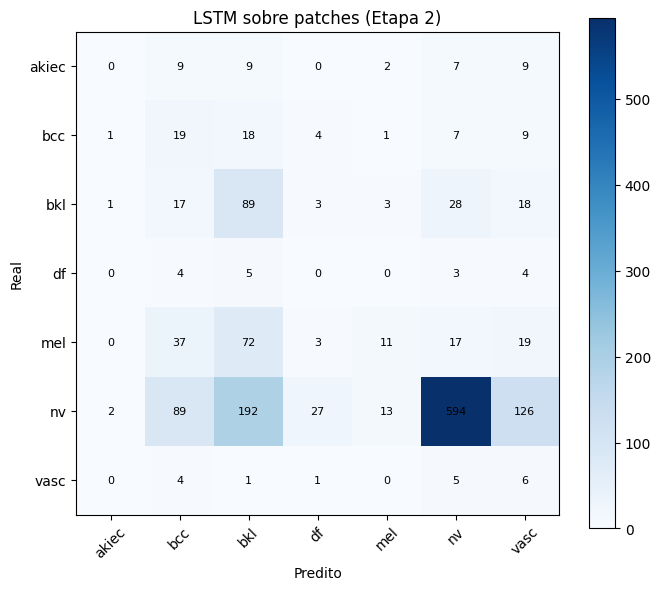

(0.19393527040276395, 0.4828744123572868)

In [33]:
metricas_lstm = avaliar_cnn(modelo_lstm, dataloaders["test"], CLASSES, device=DEVICE)
plotar_matriz_confusao(metricas_lstm["matriz_confusao"], CLASSES, titulo="LSTM sobre patches (Etapa 2)", salvar_dir=DIR_REPORT_ASSETS, nome_modelo=f"lstm_patches_{RUN_ID}")

registrar_experimento(
    nome=f"lstm_patches_{RUN_ID}",
    tipo="lstm_patches",
    hiperparametros={"tamanho_patch": 16, "dim_embedding": 128, "hidden_lstm": 128, "batch_size": BATCH_SIZE, "lr": 1e-3},
    metricas={"f1_macro": metricas_lstm["f1_macro"], "accuracy": metricas_lstm["accuracy"]},
    notas="Teste ilustrativo (Etapa 2) — não é uma tentativa de superar a CNN da seção 10.",
)
metricas_lstm["f1_macro"], metricas_lstm["accuracy"]


## 12. Exportação de artefatos

Grava o log markdown (todo `log_etapa`/`log_nota` acumulado desde o início
do notebook) e a tabela de experimentos (baseline vs. CNN vs. LSTM
patches), ambos dentro de `DIR_REPORT_ASSETS`.

In [34]:
exportar_log(path=os.path.join(DIR_REPORT_ASSETS, f"log_execucao_{RUN_ID}.md"))
exportar_experimentos(
    path_json=os.path.join(DIR_REPORT_ASSETS, "experimentos.json"),
    path_md=os.path.join(DIR_REPORT_ASSETS, "log_experimentos.md"),
)



Log exportado para /content/projeto_2_cnn_saida/outputs/report_assets/log_execucao_20260829_203117.md (54 entradas)
Experimentos exportados: '/content/projeto_2_cnn_saida/outputs/report_assets/experimentos.json' e '/content/projeto_2_cnn_saida/outputs/report_assets/log_experimentos.md' (8 registros)


## 13. TensorBoard (opcional)

Inspeciona interativamente as curvas de loss, learning rate e norma do
gradiente da CNN e da variante LSTM, direto no notebook.

In [35]:
%load_ext tensorboard
%tensorboard --logdir {DIR_RUNS}


<IPython.core.display.Javascript object>

## Resumo desta execução

- `RUN_ID`: identifica os checkpoints (`outputs/checkpoints/`) e os runs
  do TensorBoard (`runs/`) gerados por esta rodada específica.
- `metricas_baseline` / `metricas_cnn` / `metricas_lstm`: comparação de
  três abordagens na mesma tarefa (classificação de 7 classes de lesão de
  pele), todas avaliadas no mesmo conjunto de teste.
- `df_erros_cnn`: DataFrame completo de erros da CNN (não só os pares
  plotados na seção 10.4) — útil para investigar mais a fundo.
- Log completo e tabela de experimentos exportados em
  `outputs/report_assets/`.

Para uma nova rodada de treino, volte à seção 4 para gerar um novo
`RUN_ID` antes de re-executar as seções 10/11 — assim o run anterior não é
sobrescrito. `LOCAL_DIR` (seção 6.1) precisa ser resincronizado a cada
reinício de runtime; `BASE_DIR`/dados processados (Drive) não.